In [78]:
# pip install opencv-python-headless numpy


In [39]:
import cv2
import numpy as np

# Load the image
image = cv2.imread('./38549278-set-of-grey-vinyl-samples-texture-background.jpg')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Convert the grayscale image to a NumPy array
gray_array = np.array(gray_image)

# Display the shape of the NumPy array
print(gray_array.shape)

# Optionally, save the grayscale image
cv2.imwrite('grayscale_image.jpg', gray_image)


(450, 450)


True

In [40]:
max(gray_array[0])

205

In [41]:
# import cv2
# import numpy as np

# # Ask the user for the image file path
# image_path = input("Enter the path to the image file: ")

# try:
#     # Load the image
#     image = cv2.imread(image_path)

#     # Convert the image to grayscale
#     gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#     # Convert the grayscale image to a NumPy array
#     gray_array = np.array(gray_image)

#     # Display the shape of the NumPy array
#     print("Shape of the grayscale array:", gray_array.shape)

#     # Optionally, save the grayscale image
#     cv2.imwrite('grayscale_image.jpg', gray_image)

# except Exception as e:
#     print("An error occurred:", e)


In [42]:
# import random

# def generate_random_pixels(width, height, pixel_range):
#     pixels = [[(random.randint(pixel_range[0], pixel_range[1]))
#                for _ in range(width)]
#               for _ in range(height)]
#     return pixels

# # Define parameters
# width = 800
# height = 600
# pixel_range = (0, 49)  # Example: for grayscale L=50

# Generate 2D array of pixels
array1 = gray_array
array = np.array(array1, dtype=np.int16)



In [43]:
shape = gray_array.shape
width = shape[1]
height = shape[0]
pixel_range = (0, 255)
d1 = 20 # horizontal
d2 = 20 # vertical
n=45 #vertical i
m=45 #horizontal j

In [44]:
arr1 = {i: 0 for i in range(2*pixel_range[1]+1)}
arr2 = {i: 0 for i in range(-pixel_range[1], pixel_range[1]+1)}
temp_sum = {i: 0 for i in range(2*pixel_range[1]+1)}
temp_diff = {i: 0 for i in range(-pixel_range[1], pixel_range[1]+1)}

In [45]:
import numpy as np

In [46]:
import math

def ASM(S,D):
    Psum=0
    Pdiff=0

    for i in range(0,len(S)):
        Psum += (S[i])**2

    for i in range(0,len(S)):
        Pdiff += (D[i])**2

    return Psum*Pdiff

def IDM(S,D):
    Sum=0
    L= (len(D)+1)/2
    for j in range(0,len(D)):
        Sum += D[j]/(1+(j-L+1)**2)

    return Sum

def CON(S,D):
    Sum=0
    L= (len(D)+1)/2
    for j in range(0,len(D)):
        Sum += ((j-L+1)**2)*D[j]

    return Sum

def ENT(S,D):
    SumS=0
    SumD=0

    for i in range(0,len(S)):
        if(S[i]!=0):
            SumS += S[i]*(math.log10(S[i]))
        if(D[i]!=0):
            SumD += D[i]*(math.log10(D[i]))

    return -SumS-SumD

In [47]:
asm = np.array([[0 for j in range(width-m)] for i in range(height-n)],dtype=float)
idm = np.array([[0 for j in range(width-m)] for i in range(height-n)],dtype=float)
con = np.array([[0 for j in range(width-m)] for i in range(height-n)],dtype=float)
ent = np.array([[0 for j in range(width-m)] for i in range(height-n)],dtype=float)

In [48]:
def norm(ar):
  sum = np.sum(ar)
  normalized_data = ar / sum
  return normalized_data


In [49]:
for k in range(height-n):
  for l in range(width-m):
    if(l==0):
      for i in range(n-d2):
        for j in range(m-d1):
          arr1[array[k+i][l+j]+array[k+i+d2][l+j+d1]] = arr1[array[k+i][l+j]+array[k+i+d2][l+j+d1]] + 1

          arr2[array[k+i][l+j]-array[k+i+d2][l+j+d1]] = arr2[array[k+i][l+j]-array[k+i+d2][l+j+d1]] + 1

          if(j==0):
            temp_sum[array[k+i][l+j]+array[k+i+d2][l+j+d1]] = temp_sum[array[k+i][l+j]+array[k+i+d2][l+j+d1]] + 1
            temp_diff[array[k+i][l+j]-array[k+i+d2][l+j+d1]] = temp_diff[array[k+i][l+j]-array[k+i+d2][l+j+d1]] + 1

      S = np.zeros(len(list(arr1.values()))) if np.sum(list(arr1.values())) == 0 else norm(np.array(list(arr1.values())))
      D = np.zeros(len(list(arr2.values()))) if np.sum(list(arr2.values())) == 0 else norm(np.array(list(arr2.values())))
      print(np.array(list(arr1.values())), S, np.array(list(arr2.values())), D)
      asm[k][l]=float(ASM(S,D))
      idm[k][l]=float(IDM(S,D))
      con[k][l]=float(CON(S,D))
      ent[k][l]=float(ENT(S,D))

    else:
      arr1 = {key: arr1[key] - temp_sum[key] for key in arr1 if key in temp_sum}
      arr2 = {key: arr2[key] - temp_diff[key] for key in arr2 if key in temp_diff}
      temp_sum = {key: 0 for key in temp_sum}
      temp_diff = {key: 0 for key in temp_diff}
      for i in range(n-d2):
        temp_sum[array[k+i][l+m-d1-1]+array[k+i+d2][l+m-1]] = temp_sum[array[k+i][l+m-d1-1]+array[k+i+d2][l+m-1]] + 1
        temp_diff[array[k+i][l+m-d1-1]-array[k+i+d2][l+m-1]] = temp_diff[array[k+i][l+m-d1-1]-array[k+i+d2][l+m-1]] + 1
      arr1 = {key: arr1[key] + temp_sum[key] for key in arr1 if key in temp_sum}
      arr2 = {key: arr2[key] + temp_diff[key] for key in arr2 if key in temp_diff}
      S = np.zeros(len(list(arr1.values()))) if np.sum(list(arr1.values())) == 0 else norm(np.array(list(arr1.values())))
      D = np.zeros(len(list(arr2.values()))) if np.sum(list(arr2.values())) == 0 else norm(np.array(list(arr2.values())))
      asm[k][l]=float(ASM(S,D))
      idm[k][l]=float(IDM(S,D))
      con[k][l]=float(CON(S,D))
      ent[k][l]=float(ENT(S,D))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 1 0 0 1 0 0 1 1 1 1 0 0 1 1 1 2 1 1 2 0 0 2 1 1 2 2 0 0 2 1 2 2
 1 2 2 5 0 1 2 1 3 1 1 2 4 3 4 2 3 3 1 1 6 1 2 2 3 3 2 2 0 2 2 1 1 0 4 1 1
 1 0 2 0 3 2 0 1 1 2 1 4 1 1 3 4 2 0 1 3 2 3 0 3 0 1 2 0 1 0 0 3 3 1 0 2 1
 2 1 0 2 1 1 2 5 0 0 1 0 1 0 2 0 0 0 0 4 0 1 2 2 0 1 1 0 2 1 0 1 3 0 0 2 3
 1 7 2 7 1 4 3 3 2 3 3 2 1 3 2 5 1 3 1 1 0 6 5 5 6 5 2 5 3 2 5 4 2 5 5 1 6
 3 1 4 2 2 3 6 5 4 4 4 4 3 4 1 1 3 3 1 3 6 4 4 3 4 3 0 2 1 2 3 3 0 3 1 3 4
 3 3 0 0 1 5 1 8 4 3 5 2 2 3 3 1 2 2 4 3 2 3 3 4 6 0 2 1 3 1 2 0 1 1 3 2 3
 3 2 2 2 1 2 2 1 2 0 1 1 1 1 2 3 1 0 3 0 0 3 1 1 1 2 1 0 3 2 1 0 1 1 0 1 1
 0 2 1 0 1 0 1 2 1 0 1 0 1 1 1 1 1 1 0 0 1 0 1 1 3 0 0 3 2 0 0 0 0 0 0 0 1
 2 1 1 2 0 1 0 1 0 1 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 2 0 0 1 0
 0 0 1 1 0 0 2 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 

In [50]:
asm

array([[2.18723189e-05, 2.20180316e-05, 2.26736800e-05, ...,
        2.26179219e-05, 2.21411082e-05, 2.23475466e-05],
       [2.15706010e-05, 2.19055180e-05, 2.22549637e-05, ...,
        2.22045417e-05, 2.20192774e-05, 2.21449141e-05],
       [2.15623144e-05, 2.18271595e-05, 2.20458913e-05, ...,
        2.19514815e-05, 2.18691987e-05, 2.19704321e-05],
       ...,
       [1.94246117e-05, 1.94230383e-05, 1.94247232e-05, ...,
        1.94212834e-05, 1.94216880e-05, 1.94214361e-05],
       [1.94880468e-05, 1.94867628e-05, 1.94881839e-05, ...,
        1.94851102e-05, 1.94851321e-05, 1.94848567e-05],
       [1.95513215e-05, 1.95503039e-05, 1.95516021e-05, ...,
        1.95487215e-05, 1.95486573e-05, 1.95482201e-05]])

In [51]:
idm

array([[0.01042431, 0.00990733, 0.00801015, ..., 0.01070039, 0.01470781,
        0.00900913],
       [0.01015989, 0.00954731, 0.00856954, ..., 0.00912651, 0.01199102,
        0.00905879],
       [0.00936062, 0.0092248 , 0.00856864, ..., 0.00894835, 0.0108612 ,
        0.00891965],
       ...,
       [0.02293828, 0.02293356, 0.02293893, ..., 0.02293913, 0.02293783,
        0.02293813],
       [0.02297766, 0.02297296, 0.02297829, ..., 0.02297852, 0.02297718,
        0.02297739],
       [0.02301687, 0.02301149, 0.02301682, ..., 0.02301705, 0.02301568,
        0.02301551]])

In [52]:
con

array([[8685.776     , 8672.3824    , 8953.8944    , ..., 8547.0192    ,
        8547.8       , 8547.776     ],
       [8624.2456    , 8784.32081633, 8931.08979592, ..., 8724.29061224,
        8723.27836735, 8724.02122449],
       [8738.        , 8846.57863014, 8946.18630137, ..., 8805.90246575,
        8806.20493151, 8806.01589041],
       ...,
       [4972.82531735, 4973.42899617, 4973.30149488, ..., 4973.30668459,
        4973.26881009, 4973.28293187],
       [4962.75265003, 4963.33236671, 4963.22791791, ..., 4963.22437867,
        4963.19629164, 4963.21103847],
       [4952.74016869, 4953.29786647, 4953.20783047, ..., 4953.20528752,
        4953.18015019, 4953.19516922]])

In [53]:
ent

array([[4.78629001, 4.78441019, 4.77578425, ..., 4.77202858, 4.77923784,
        4.7775598 ],
       [4.79724649, 4.78985511, 4.7846749 , ..., 4.78225793, 4.78562556,
        4.78484148],
       [4.79928374, 4.79323655, 4.78930943, ..., 4.7887506 , 4.7901026 ,
        4.78954767],
       ...,
       [4.89398801, 4.89396497, 4.893943  , ..., 4.89402638, 4.89403799,
        4.89403487],
       [4.89306195, 4.89303414, 4.89301541, ..., 4.89309501, 4.89311032,
        4.89310729],
       [4.89214059, 4.89210965, 4.89209315, ..., 4.89216911, 4.89218662,
        4.89218493]])

In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [55]:
data ={}
df = pd.DataFrame(data)


# Create a 2D NumPy array
array_2d = asm

# Flatten the array
flattened_array_asm = array_2d.ravel()

# Create a Pandas Series from the flattened array
asm_s = pd.Series(flattened_array_asm)
df['asm'] = asm_s


# Create a 2D NumPy array
array_2d = idm

# Flatten the array
flattened_array_idm = array_2d.ravel()

# Create a Pandas Series from the flattened array
idm_s = pd.Series(flattened_array_idm)
df['idm'] = idm_s


# Create a 2D NumPy array
array_2d = con

# Flatten the array
flattened_array_con = array_2d.ravel()

# Create a Pandas Series from the flattened array
con_s = pd.Series(flattened_array_con)
df['con'] = con_s

# Create a 2D NumPy array
array_2d = ent

# Flatten the array
flattened_array_ent = array_2d.ravel()

# Create a Pandas Series from the flattened array
ent_s = pd.Series(flattened_array_ent)
df['ent'] = ent_s









In [56]:
# df= pd.read_csv("/content/drive/MyDrive/GNR 607/wine-clustering.csv")
# df

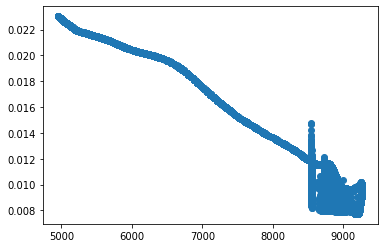

In [57]:
X = df.iloc[:,2]
y = df.iloc[:,1]
plt.scatter(X,y);

In [58]:
# # import module
# from sklearn.preprocessing import StandardScaler

# # compute required values
# scaler = StandardScaler()
# model = scaler.fit(df)
# scaled_data = model.transform(df)

# # print scaled data
# print(scaled_data)


In [59]:
# from sklearn.decomposition import PCA
# pca_2 = PCA(n_components=3)
# pca_2_result = pca_2.fit_transform(scaled_data)
# print('Explained variation per principal component: {}'.format(pca_2.explained_variance_ratio_))

# # >> Explained variation per principal component: [0.36198848 0.1920749 ]

# print('Cumulative variance explained by 2 principal components: {:.2%}'.format(np.sum(pca_2.explained_variance_ratio_)))


In [60]:
scaled_data = df

In [61]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4,max_iter=1000)
kmeans.fit(scaled_data)

KMeans(max_iter=1000, n_clusters=4)

In [62]:
cl = kmeans.predict(scaled_data)
cl.shape

(164025,)

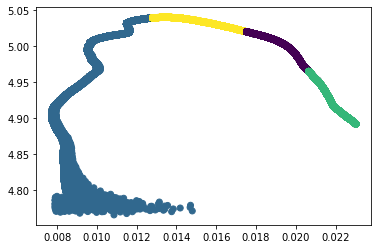

In [63]:
X = df.iloc[:,1]
y = df.iloc[:,-1]
plt.scatter(X,y,c=cl);

In [64]:
kmeans.inertia_

12609227686.241615

In [65]:
# from sklearn.model_selection import ParameterGrid
# import sklearn.metrics as metrics

# # candidate values for our number of cluster
# parameters = [2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 40]
# # instantiating ParameterGrid, pass number of clusters as input
# parameter_grid = ParameterGrid({'n_clusters': parameters})
# best_score = -1
# kmeans_model = KMeans()     # instantiating KMeans model
# silhouette_scores = []
# # evaluation based on silhouette_score
# for p in parameter_grid:
#     kmeans_model.set_params(**p)    # set current hyper parameter
#     kmeans_model.fit(df)          # fit model on wine dataset, this will find clusters based on parameter p
#     ss = metrics.silhouette_score(df, kmeans_model.labels_)   # calculate silhouette_score
#     silhouette_scores += [ss]       # store all the scores
#     print('Parameter:', p, 'Score', ss)
#     # check p which has the best score
#     if ss > best_score:
#         best_score = ss
#         best_grid = p
# # plotting silhouette score
# plt.bar(range(len(silhouette_scores)), list(silhouette_scores), align='center', color='#722f59', width=0.5)
# plt.xticks(range(len(silhouette_scores)), list(parameters))
# plt.title('Silhouette Score', fontweight='bold')
# plt.xlabel('Number of Clusters')
# plt.show()


In [66]:
# fitting KMeans
kmeans = KMeans(n_clusters=4)
kmeans.fit(scaled_data)

final_cl = kmeans.predict(scaled_data)

In [67]:
# # def min_arr(arr):
# #   min = 255
# #   for i in arr:
# #    if min>i:
# #     min = i
# #   return min

def max_arr(arr):
    max = 0
    for i in range(0,arr.size):
      if max<arr[i]:
       max = arr[i]
    return max

In [68]:
# # max_v = max_arr(cl)# cl = scale_to_0_255(cl
# # final_cl = final_cl*255
max_v = max_arr(final_cl)
final_cl = final_cl*(255/max_v)

In [69]:
final_cl.shape

(164025,)

In [70]:
final_cl = final_cl.reshape(ent.shape[0],ent.shape[1])
final_cl.shape

(405, 405)

In [71]:
final_cl

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ...,
       [85., 85., 85., ..., 85., 85., 85.],
       [85., 85., 85., ..., 85., 85., 85.],
       [85., 85., 85., ..., 85., 85., 85.]])

In [72]:
# import numpy as np

# def scale_to_0_255(arr):
#     min_value = min_arr(arr)
#     max_value = max_arr(arr)

#     scaled_arr = []

#     for value in arr:
#         scaled_value = ((value - min_value) / (max_value - min_value)) * 255
#         scaled_arr.append(scaled_value)

#     return scaled_arr


In [73]:
final_cl

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ...,
       [85., 85., 85., ..., 85., 85., 85.],
       [85., 85., 85., ..., 85., 85., 85.],
       [85., 85., 85., ..., 85., 85., 85.]])

In [74]:
count = 0
for i in final_cl:
  for j in i:
    count+=j

count = count/255
count

45225.0

In [75]:
df_new = pd.DataFrame(final_cl)
df_new.to_csv('sample_data.csv', index=True)


In [76]:
# image = cv2.cvtColor(cl)  # Convert grayscale to BGR (color) image

# # Save the image to a file (optional)
# cv2.imwrite('output.png', image)

grayscale_image = cv2.merge((final_cl,final_cl,final_cl))


# Save the grayscale image to a file (optional)
cv2.imwrite('output3.png', grayscale_image)
# cv2.imshow(grayscale_image)


True